# Dynamic Analysis

In [36]:
import networkx as nx
import dynetx as dn
import numpy as np
import collections
import matplotlib.pyplot as plt
import dynetx.algorithms as al
from sklearn.metrics import r2_score
from scipy.optimize import curve_fit
from scipy.stats import chisquare
from wordcloud import WordCloud
from PIL import Image
%matplotlib inline

In [57]:
def get_label_percentage(dictionary, label):
    sum = 0
    for key in dictionary:
        sum += dictionary[key]
    return float(dictionary[label]) / float(sum)

In [58]:
def pie_chart_function(dictionary, name_file = None, title = None):
    sector = list (dictionary.keys()) 
    data = list (dictionary.values())
# Wedge properties
    wp = { 'linewidth' : 1, 'edgecolor' : "green" }
 
# Creating autocpt arguments
    def func(pct, allvalues):
        absolute = int(pct / 100.*np.sum(allvalues))
        return "{:.1f}%".format(pct, absolute)
 
# Creating plot
    fig, ax = plt.subplots(figsize =(10, 7))
    wedges, texts, autotexts = ax.pie(data,
                                  autopct = lambda pct: func(pct, data),
                                  labels = sector,
                                  shadow = True,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="black"))
    plt.setp(autotexts, size = 8, weight ="bold")
    ax.set_title(f"{title}")
    plt.savefig(f"plots\\pie_{name_file}.pdf", format="pdf", bbox_inches="tight")
# show plot
    plt.show()

In [2]:
list_p = np.load('..\\data_collection\\graph\\list_pos_graph_label.npy',allow_pickle='TRUE').item()
list_n = np.load('..\\data_collection\\graph\\list_neg_graph_label.npy',allow_pickle='TRUE').item()
list_t = np.load('..\\data_collection\\graph\\list_graph_label.npy',allow_pickle='TRUE').item()

In [3]:
mykeys_p = [*list_p]
tot_pos = nx.read_gpickle('..\\data_collection\\graph\\pos_graph_tot.gpickle')
tot_pos.nodes(data=True)
labels = list()
for k in range(1,452):
    a = list((list(tot_pos.nodes(data = True))[k][1].values()))
    labels.append(a)

## Create Dynamic Network from snap

In [4]:
p = dn.DynGraph()
n = dn.DynGraph()
t = dn.DynGraph()
for year in mykeys_p:
    p.add_interactions_from(list_p[year].edges, t= year-1961)
    n.add_interactions_from(list_n[year].edges, t= year-1961)
    t.add_interactions_from(list_t[year].edges, t= year-1961)
    print(f'Done: {year-1961}/{len(mykeys_p)}')

Done: 1/61
Done: 2/61
Done: 3/61
Done: 4/61
Done: 5/61
Done: 6/61
Done: 7/61
Done: 8/61
Done: 9/61
Done: 10/61
Done: 11/61
Done: 12/61
Done: 13/61
Done: 14/61
Done: 15/61
Done: 16/61
Done: 17/61
Done: 18/61
Done: 19/61
Done: 20/61
Done: 21/61
Done: 22/61
Done: 23/61
Done: 24/61
Done: 25/61
Done: 26/61
Done: 27/61
Done: 28/61
Done: 29/61
Done: 30/61
Done: 31/61
Done: 32/61
Done: 33/61
Done: 34/61
Done: 35/61
Done: 36/61
Done: 37/61
Done: 38/61
Done: 39/61
Done: 40/61
Done: 41/61
Done: 42/61
Done: 43/61
Done: 44/61
Done: 45/61
Done: 46/61
Done: 47/61
Done: 48/61
Done: 49/61
Done: 50/61
Done: 51/61
Done: 52/61
Done: 53/61
Done: 54/61
Done: 55/61
Done: 56/61
Done: 57/61
Done: 58/61
Done: 59/61
Done: 60/61
Done: 61/61


In [5]:
p.number_of_edges(), n.number_of_edges(), t.number_of_edges()

(106902, 29501, 122512)

In [6]:
n_snap = len(p.temporal_snapshots_ids())

In [7]:
pn_t = p.time_slice(1, n_snap)
nn_t = n.time_slice(1, n_snap)

## Interactions per snapshots

In [8]:
p_it = pn_t.interactions_per_snapshots()
n_it = nn_t.interactions_per_snapshots()

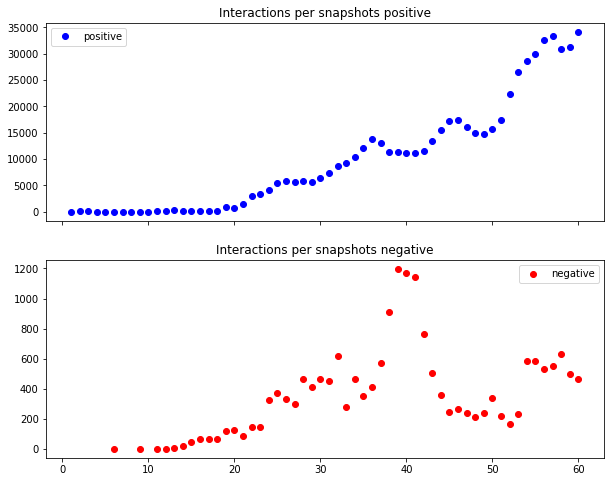

In [9]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(10, 8))
ax1.plot(p_it.keys(),p_it.values(), linestyle=" ", label = 'positive', marker = 'o', color = 'blue')
ax1.set_title('Interactions per snapshots positive')
ax1.legend()
ax2.plot(n_it.keys(),n_it.values(), linestyle=" ", label = 'negative', marker = 'o', color = 'red')
ax2.set_title('Interactions per snapshots negative')
ax2.legend()
plt.savefig("plots\\inter_snap.pdf", format="pdf", bbox_inches="tight")
plt.show()

##  inter_event_time for general, nodes and edges

In [10]:
p_even_distribution = p.inter_event_time_distribution()
n_even_distribution = n.inter_event_time_distribution()
print(f"Number interactions: temporal distance\t{p_even_distribution}")
print(f"Number interactions: temporal distance\t{n_even_distribution}")

Number interactions: temporal distance	{0: 307007, 1: 61}
Number interactions: temporal distance	{0: 40754, 1: 55, 2: 1, 3: 1}


In [11]:
for node in p.nodes() :
    r = p.inter_event_time_distribution(node)
    print(f"Number interactions positive graph {node}: temporal distance\t{r}")

Number interactions positive graph AEP: temporal distance	{0: 1377, 1: 53, 2: 4}
Number interactions positive graph CNP: temporal distance	{0: 1514, 1: 57, 2: 2}
Number interactions positive graph ED: temporal distance	{0: 1327, 1: 55, 2: 3}
Number interactions positive graph GE: temporal distance	{0: 1041, 1: 57, 2: 2}
Number interactions positive graph MRK: temporal distance	{0: 1504, 1: 59, 2: 1}
Number interactions positive graph BA: temporal distance	{0: 1505, 2: 2, 1: 50, 4: 1, 3: 1}
Number interactions positive graph CAT: temporal distance	{0: 1503, 1: 57, 2: 2}
Number interactions positive graph DIS: temporal distance	{0: 1471, 1: 61}
Number interactions positive graph HON: temporal distance	{0: 1572, 1: 49, 2: 2, 3: 1, 5: 1}
Number interactions positive graph HPQ: temporal distance	{0: 1584, 3: 1, 1: 58}
Number interactions positive graph IBM: temporal distance	{0: 1344, 2: 2, 1: 54, 3: 1}
Number interactions positive graph IP: temporal distance	{0: 1486, 2: 4, 1: 50, 3: 1}
Nu

In [12]:
for node in n.nodes() :
    r = n.inter_event_time_distribution(node)
    print(f"Number interactions positive graph {node}: temporal distance\t{r}")

Number interactions positive graph BA: temporal distance	{0: 103, 10: 1, 1: 30, 2: 4, 9: 1, 3: 1}
Number interactions positive graph CVX: temporal distance	{9: 1, 0: 84, 1: 30, 2: 6, 3: 2}
Number interactions positive graph DTE: temporal distance	{4: 1, 5: 1, 1: 38, 0: 124, 2: 5, 3: 1}
Number interactions positive graph MRO: temporal distance	{1: 40, 8: 1, 2: 2, 0: 203, 3: 1, 5: 1}
Number interactions positive graph XOM: temporal distance	{1: 33, 8: 1, 0: 97, 3: 2, 2: 5}
Number interactions positive graph HPQ: temporal distance	{0: 111, 8: 1, 3: 1, 1: 30, 2: 8}
Number interactions positive graph MCD: temporal distance	{1: 39, 5: 1, 2: 3, 7: 1, 0: 106}
Number interactions positive graph PG: temporal distance	{4: 1, 1: 30, 0: 87, 3: 3, 2: 7}
Number interactions positive graph AEP: temporal distance	{0: 121, 1: 43, 2: 2, 3: 2}
Number interactions positive graph DIS: temporal distance	{0: 77, 2: 6, 1: 22, 6: 1, 3: 3, 4: 1}
Number interactions positive graph JNJ: temporal distance	{0: 120, 

In [13]:
for u,v in p.edges():
    if u!=v:
        r = p.inter_event_time_distribution(u,v)
        print(f"Number interactions positive graph {u}-{v}: temporal distance\t{r}")

Number interactions positive graph AEP-CNP: temporal distance	{7: 1, 14: 1, 39: 1}
Number interactions positive graph AEP-ED: temporal distance	{18: 1, 2: 1, 40: 1}
Number interactions positive graph AEP-GE: temporal distance	{3: 1, 19: 1, 33: 1}
Number interactions positive graph AEP-MRK: temporal distance	{3: 1, 21: 1, 36: 1}
Number interactions positive graph AEP-CAT: temporal distance	{2: 1, 30: 1, 27: 1}
Number interactions positive graph AEP-DIS: temporal distance	{2: 1, 22: 1, 35: 1}
Number interactions positive graph AEP-DTE: temporal distance	{59: 1}
Number interactions positive graph AEP-HON: temporal distance	{2: 1, 5: 1, 1: 1, 14: 1, 37: 1}
Number interactions positive graph AEP-KO: temporal distance	{2: 1, 21: 1, 36: 1}
Number interactions positive graph AEP-KR: temporal distance	{4: 1, 16: 1, 39: 1}
Number interactions positive graph AEP-MRO: temporal distance	{3: 1, 25: 1, 1: 1, 5: 1, 19: 1}
Number interactions positive graph AEP-XOM: temporal distance	{4: 1, 17: 1, 38: 

In [14]:
for u,v in n.edges():
    if u!=v:
        r = n.inter_event_time_distribution(u,v)
        print(f"Number interactions positive graph {u}-{v}: temporal distance\t{r}")

Number interactions positive graph BA-CVX: temporal distance	{}
Number interactions positive graph BA-DTE: temporal distance	{}
Number interactions positive graph BA-MRO: temporal distance	{}
Number interactions positive graph BA-XOM: temporal distance	{}
Number interactions positive graph BA-HAL: temporal distance	{1: 1}
Number interactions positive graph BA-IFF: temporal distance	{3: 1}
Number interactions positive graph BA-BAC: temporal distance	{2: 1}
Number interactions positive graph BA-PNR: temporal distance	{}
Number interactions positive graph BA-AVY: temporal distance	{6: 1}
Number interactions positive graph BA-ECL: temporal distance	{6: 1}
Number interactions positive graph BA-LLY: temporal distance	{2: 1}
Number interactions positive graph BA-MDT: temporal distance	{1: 1}
Number interactions positive graph BA-TAP: temporal distance	{6: 1}
Number interactions positive graph BA-PFE: temporal distance	{}
Number interactions positive graph BA-WDC: temporal distance	{}
Number i

##  Degree 

In [16]:
p_degree = collections.defaultdict(list)
n_degree = collections.defaultdict(list)
for time in range(1,n_snap+1):
    for node in p.nodes():
        r = p.degree(t=time)[node]
        if (r!=0):
            p_degree[time].append(r)
            print(f'Done (positive) time:{time} node:{node}')
    for node in n.nodes():
        r = n.degree(t=time)[node]
        if (r!=0):
            n_degree[time].append(r)
            print(f'Done (negative) time:{time} node:{node}')

Done (positive) time:1 node:AEP
Done (positive) time:1 node:CNP
Done (positive) time:1 node:ED
Done (positive) time:1 node:GE
Done (positive) time:1 node:MRK
Done (positive) time:1 node:BA
Done (positive) time:1 node:CAT
Done (positive) time:1 node:DIS
Done (positive) time:1 node:HON
Done (positive) time:1 node:HPQ
Done (positive) time:1 node:IBM
Done (positive) time:1 node:IP
Done (positive) time:1 node:JNJ
Done (positive) time:1 node:KR
Done (positive) time:1 node:MMM
Done (positive) time:1 node:MO
Done (positive) time:1 node:MSI
Done (positive) time:1 node:PG
Done (positive) time:1 node:GD
Done (positive) time:1 node:KO
Done (positive) time:1 node:CVX
Done (positive) time:1 node:RTX
Done (positive) time:1 node:XOM
Done (positive) time:1 node:DTE
Done (positive) time:1 node:MRO
Done (positive) time:2 node:AEP
Done (positive) time:2 node:CNP
Done (positive) time:2 node:ED
Done (positive) time:2 node:GE
Done (positive) time:2 node:MRK
Done (positive) time:2 node:BA
Done (positive) time

In [17]:
np.save('p_degree.npy', p_degree) 
np.save('n_degree.npy', n_degree) 

In [15]:
p_degree = np.load('p_degree.npy',allow_pickle='TRUE').item()
n_degree = np.load('n_degree.npy',allow_pickle='TRUE').item()

In [ ]:
for k in range (0,10):
    fig, axes = plt.subplots(2,3,figsize = (20,10))
    for i, ax in enumerate(axes.flatten()):
        degree_hist=collections.Counter(p_degree[i+1+6*k])
        ax.semilogy(degree_hist.keys(), degree_hist.values(),marker = 'o', color = 'blue', linestyle=" ")
        ax.set_xlabel('#Degree')
        ax.set_ylabel('#Nodes')
        ax.set_title(f'Degree distribution positive snapshot {i+1 +6*k}')
        plt.savefig(f'plots\\first_{(k+1)}_snap_degree_pos_dist.pdf')  
    plt.show()
for k in range (2,10):
    fig, axes = plt.subplots(2,3,figsize = (20,10))
    for i, ax in enumerate(axes.flatten()):
        degree_hist=collections.Counter(n_degree[i+1+6*k])
        ax.semilogy(degree_hist.keys(), degree_hist.values(),marker = 'o', color = 'red', linestyle=" ")
        ax.set_xlabel('Degree')
        ax.set_ylabel('#Nodes')
        ax.set_title(f'Degree distribution negative snapshot {i+1 +6*k}')
        plt.savefig(f'plots\\first_{(k+1)}_snap_degree_neg_dist.pdf')  
    plt.show()

### Fit degree distribution negative

In [38]:
# Define the fit function for negative
def fit_powerlaw(x, y,init):
    opt_parms, parm_cov =curve_fit(model_func, x, y, init,maxfev=1000)
    A, B = opt_parms
    return A, B, parm_cov
def model_func(x, A, B):
    return A +B*x

In [49]:
degree_hist=collections.Counter(n_degree[61])
xdata = np.log(np.array(list(degree_hist.keys())))
ydata = np.log(np.array(list(degree_hist.values())))

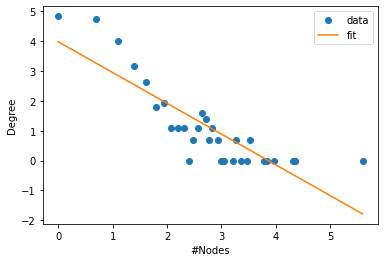

A: 3.98+-0.34, 	 B: -1.03+-0.11, chi: 0.9999999781831583, R2: 0.74


In [51]:
# Actual parameters
init = (0.1, -1.5)
A, B ,parm_cov = fit_powerlaw(xdata, ydata, init)
SE = np.sqrt(np.diag(parm_cov))
x_fit = np.linspace(0,max(xdata),10000)
fit_y = model_func(x_fit, A, B)
y_fit = model_func(xdata, A, B)
chisq = chisquare(f_obs = ydata, f_exp=y_fit)
R2 = r2_score(ydata,y_fit)
plt.plot(xdata, ydata, 'o', label='data')
plt.plot(x_fit, fit_y, '-', label='fit')
plt.legend()
plt.ylabel('Degree')
plt.xlabel('#Nodes')
plt.savefig(f'plots\\60_snap_fit_degree_neg_dist.pdf')  
plt.show()
print(f'A: {A:.2f}+-{SE[0]:.2f}, \t B: {B:.2f}+-{SE[1]:.2f}, chi: {chisq[1]:}, R2: {R2:.2f}')

## Coverage and contribution

In [52]:
print(f'Coverege positive: {p.coverage()}\t Coverege negative: {n.coverage()}')

Coverege positive: 0.5487332339791356	 Coverege negative: 0.500208986415883


In [54]:
contribution_positive_node = collections.defaultdict(list)
contribution_negative_node = collections.defaultdict(list)
for node in p.nodes():
    a = p.node_contribution(node)
    contribution_positive_node[node] = a
    print(f'Done node {node}')
for node in n.nodes():
    a = n.node_contribution(node)
    contribution_negative_node[node] = a
    print(f'Done node {node}')

Done node AEP
Done node CNP
Done node ED
Done node GE
Done node MRK
Done node BA
Done node CAT
Done node DIS
Done node HON
Done node HPQ
Done node IBM
Done node IP
Done node JNJ
Done node KR
Done node MMM
Done node MO
Done node MSI
Done node PG
Done node GD
Done node KO
Done node CVX
Done node RTX
Done node XOM
Done node DTE
Done node MRO
Done node MCD
Done node DD
Done node DE
Done node ETR
Done node F
Done node HAL
Done node AXP
Done node WFC
Done node BLL
Done node BMY
Done node LLY
Done node WMT
Done node EMR
Done node ETN
Done node PEP
Done node PFE
Done node TXN
Done node WRB
Done node AIG
Done node CMI
Done node ECL
Done node GWW
Done node MDT
Done node AVY
Done node BK
Done node CVS
Done node SPGI
Done node BAC
Done node BDX
Done node PNR
Done node TER
Done node NEE
Done node PNW
Done node EIX
Done node CL
Done node ITW
Done node WHR
Done node CLX
Done node MKC
Done node TGT
Done node CMS
Done node ES
Done node EVRG
Done node EXC
Done node FRT
Done node LNT
Done node NI
Done no

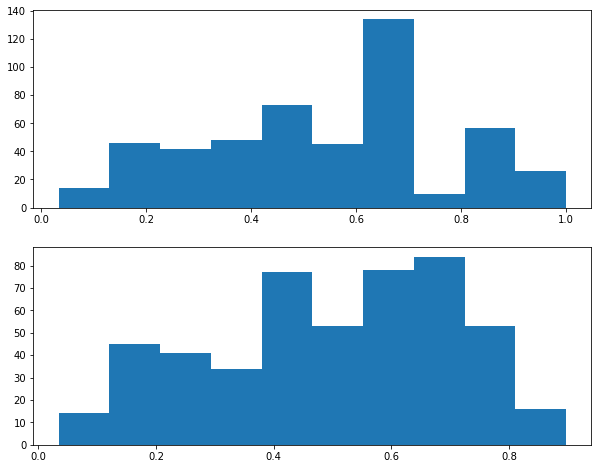

In [27]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
ax1.hist(contribution_positive_node.values())
ax2.hist(contribution_negative_node.values())
plt.show()

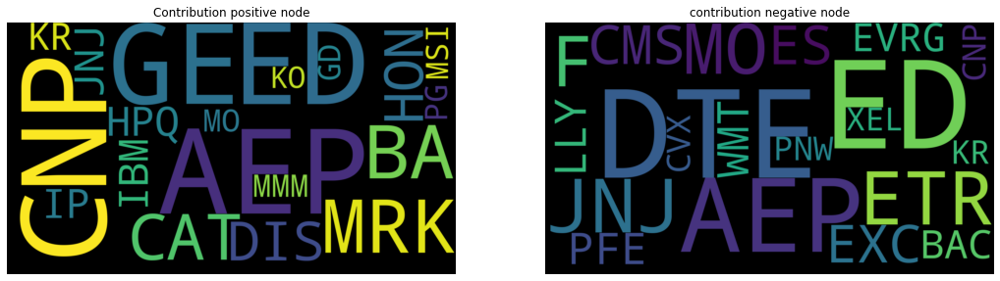

In [56]:
canvas_width=1920
canvas_height=1080
fig, ax = plt.subplots(1,2,figsize = (18,9))
wordcloud_neg = WordCloud(width=canvas_width,height=canvas_height,
                      max_words=20, normalize_plurals=False).generate_from_frequencies(contribution_negative_node)
wordcloud_pos = WordCloud(width=canvas_width,height=canvas_height,
                      max_words=20, normalize_plurals=False).generate_from_frequencies(contribution_positive_node)
ax[0].imshow(wordcloud_pos, interpolation='bilinear')
ax[0].set_title('Contribution positive node')
ax[1].imshow(wordcloud_neg, interpolation='bilinear')
ax[1].set_title('contribution negative node')
ax[0].axis('off')
ax[1].axis('off')
plt.savefig(f'plots\\wordcloud_contribution.pdf')  
plt.show()

## Analyze density

In [59]:
p_density_ids = list()
n_density_ids = list()
for t in p.temporal_snapshots_ids():
    a = p.snapshot_density(t)
    p_density_ids.append(a)
    print(f'Done positive ids: {t}')
for t in n.temporal_snapshots_ids():
    a = n.snapshot_density(t)
    n_density_ids.append(a)
    print(f'Done positive ids: {t}')

Done positive ids: 1
Done positive ids: 2
Done positive ids: 3
Done positive ids: 4
Done positive ids: 5
Done positive ids: 6
Done positive ids: 7
Done positive ids: 8
Done positive ids: 9
Done positive ids: 10
Done positive ids: 11
Done positive ids: 12
Done positive ids: 13
Done positive ids: 14
Done positive ids: 15
Done positive ids: 16
Done positive ids: 17
Done positive ids: 18
Done positive ids: 19
Done positive ids: 20
Done positive ids: 21
Done positive ids: 22
Done positive ids: 23
Done positive ids: 24
Done positive ids: 25
Done positive ids: 26
Done positive ids: 27
Done positive ids: 28
Done positive ids: 29
Done positive ids: 30
Done positive ids: 31
Done positive ids: 32
Done positive ids: 33
Done positive ids: 34
Done positive ids: 35
Done positive ids: 36
Done positive ids: 37
Done positive ids: 38
Done positive ids: 39
Done positive ids: 40
Done positive ids: 41
Done positive ids: 42
Done positive ids: 43
Done positive ids: 44
Done positive ids: 45
Done positive ids: 

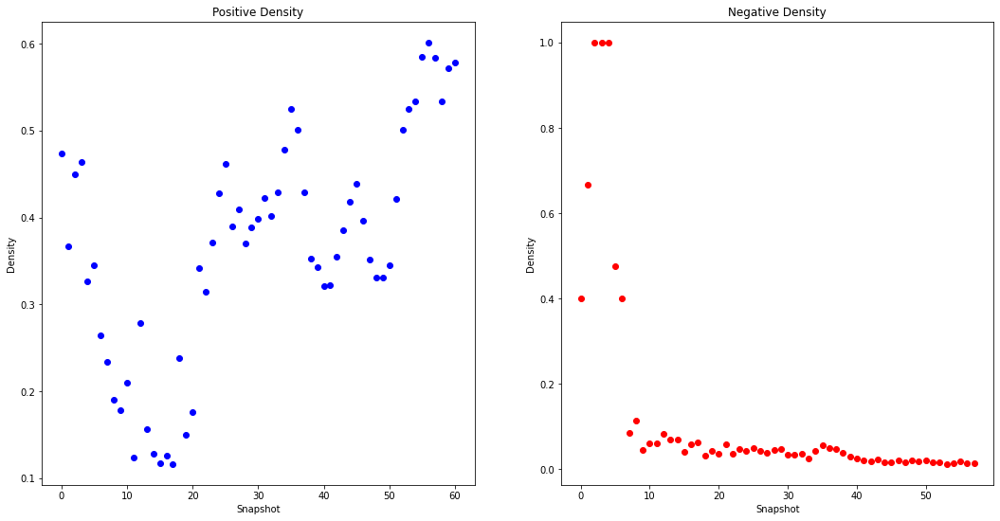

In [61]:
fig, ax = plt.subplots(1,2,figsize = (18,9))
ax[0].plot(p_density_ids,marker = 'o', color = 'blue',linestyle=" ")
ax[0].set_title('Positive Density')
ax[0].set_xlabel('Snapshot')
ax[0].set_ylabel('Density')
ax[1].plot(n_density_ids,marker = 'o', color = 'red',linestyle=" ")
ax[1].set_title('Negative Density')
ax[1].set_ylabel('Density')
ax[1].set_xlabel('Snapshot')
plt.savefig(f'plots\\density_dynamic.pdf')  
plt.show()